## Trigger Word Detection

In this Project We will construct a speech dataset and implement an algorithm for trigger word detection or keyword detection. 


**Objectives**: 
- Structure a speech recognition project
- Synthesize and process audio recordings to create train/dev datasets
- Train a trigger word detection model and make predictions

## Import Libraries

In [3]:
import numpy as np
import IPython
import os
from pydub import AudioSegment
from IPython.display import Audio, display
import matplotlib.pyplot as plt
from scipy.io import wavfile

## Data synthesis: Prepareing Speech Dataset 

Building a dataset for trigger word detection algorithm. 
* A speech dataset should ideally be as close as possible to the application we will want to run it on. 
* In this case, we'd like to detect the word "activate" in working environments (library, home, offices, open-spaces ...). 
* we need to create recordings with a mix of positive words ("activate") and negative words (random words other than activate) on different background sounds.

### Listening to the Data   

* In the raw_data directory, we have a subset of the raw audio files of the positive words, negative words, and background noise. We will use these audio files to synthesize a dataset to train the model. 
    * The "activate" directory contains positive examples of people saying the word "activate". 
    * The "negatives" directory contains negative examples of people saying random words other than "activate".
    * There is one word per audio recording. 
    * The "backgrounds" directory contains 10 second clips of background noise in different environments.

In [26]:
def list_all_files(directory):
    for root, dirs, files in os.walk(directory):
        for file in files:
            print(os.path.join(root, file))

directory_path = './' 
list_all_files(directory_path)

./model.ipynb
./processing.ipynb
./.ipynb_checkpoints/processing-checkpoint.ipynb
./.ipynb_checkpoints/model-checkpoint.ipynb
./raw_data/.DS_Store
./raw_data/activates/3_act2.wav
./raw_data/activates/2_act3.wav
./raw_data/activates/1_act2.wav
./raw_data/activates/2.wav
./raw_data/activates/3_act3.wav
./raw_data/activates/4_act2.wav
./raw_data/activates/1.wav
./raw_data/activates/1_act3.wav
./raw_data/activates/2_act2.wav
./raw_data/activates/3.wav
./raw_data/negatives/4.wav
./raw_data/negatives/3_2.wav
./raw_data/negatives/1_0.wav
./raw_data/negatives/2.wav
./raw_data/negatives/2_1.wav
./raw_data/negatives/5.wav
./raw_data/negatives/5_1.wav
./raw_data/negatives/1.wav
./raw_data/negatives/3.wav
./raw_data/negatives/4_0.wav
./raw_data/backgrounds/2.wav
./raw_data/backgrounds/1.wav
./raw_data/dev/2.wav
./raw_data/dev/1.wav


In [5]:
files = os.listdir('./raw_data/activates/')
print(files)

['3_act2.wav', '2_act3.wav', '1_act2.wav', '2.wav', '3_act3.wav', '4_act2.wav', '1.wav', '1_act3.wav', '2_act2.wav', '3.wav']


In [6]:
for file in files:
    path = os.path.join('./raw_data/activates/', file)
    display(Audio(path))

In [7]:
files = os.listdir('./raw_data/negatives/')
for file in files:
    path = os.path.join('./raw_data/negatives/', file)
    display(Audio(path))

In [8]:
files = os.listdir('./raw_data/backgrounds/')
for file in files:
    path = os.path.join('./raw_data/backgrounds', file)
    display(Audio(path))

We will use these three types of recordings (positives/negatives/backgrounds) to create a labeled dataset.

### Audio Recordings to Spectrograms

* A microphone records little variations in air pressure over time, and it is these little variations in air pressure that our ear also perceives as sound. 
* We can think of an audio recording as a long list of numbers measuring the little air pressure changes detected by the microphone. 
* We will use audio sampled at 44100 Hz. 
    * This means the microphone gives us 44,100 numbers per second. 
    * Thus, this means, a 10 second audio clip is represented by 441,000 numbers (= $10 \times 44,100$). 

#### Spectrogram
* It is quite difficult to figure out from this "raw" representation of audio whether the word "activate" was said. 
* In  order to help our sequence model more easily learn to detect trigger words, we will compute a *spectrogram* of the audio. 
* The spectrogram tells us how much different frequencies are present in an audio clip at any moment in time. 
    * A spectrogram is computed by sliding a window over the raw audio signal, and calculating the most active frequencies in each window using a Fourier transform. 

**A spectrogram shows how the frequencies in a sound evolve over time**.

- Think of it as an image:

- X-axis: Time

- Y-axis: Frequency

- Color/Intensity: Amplitude (loudness) of that frequency at that time

In [9]:
IPython.display.Audio("raw_data/backgrounds/1.wav")

In [10]:
def get_wav_info(wav_file):
    rate, data = wavfile.read(wav_file)
    return rate, data

rate, data = get_wav_info("raw_data/backgrounds/1.wav")

In [11]:
print("samples/sec:", rate)
print("data shape:", data.shape)

samples/sec: 44100
data shape: (441000, 2)


In [12]:
# Calculate and plot spectrogram for a wav audio file
def graph_spectrogram(wav_file):
    rate, data = get_wav_info(wav_file)    
    nfft = 200                              # Window size for the Fast Fourier Transform (FFT).
    fs = 8000                               # Sampling frequencies
    noverlap = 120                          # Overlap between successive windows 
    nchannels = data.ndim                   # number of dimensions of the data array.
    if nchannels == 1:
        pxx, freqs, bins, im = plt.specgram(data, nfft, fs, noverlap = noverlap)
    elif nchannels == 2:
        pxx, freqs, bins, im = plt.specgram(data[:,0], nfft, fs, noverlap = noverlap)
    return pxx

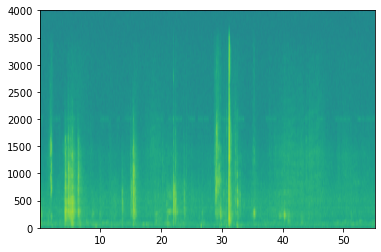

In [14]:
x = graph_spectrogram("raw_data/backgrounds/1.wav")

In [15]:
x.shape

(101, 5511)

In [16]:
# The number of time steps input to the model from the spectrogram
Tx = 5511             

In [17]:
# Number of frequencies input to the model at each time step of the spectrogram,
# At each time step, we extract a vector of 101 frequency values
n_freq = 101          

#### Dividing into time-intervals
we divide a 10 second interval of time with different units (steps).
* Raw audio divides 10 seconds into 441,000 units.
* A spectrogram divides 10 seconds into 5,511 units.
    * $T_x = 5511$
* We will use a Python module `pydub` to synthesize audio, and it divides 10 seconds into 10,000 units.
* The output of our model will divide 10 seconds into 1,375 units.
    * $T_y = 1375$
    * For each of the 1375 time steps, the model predicts whether someone recently finished saying the trigger word "activate". 
* All of these are hyperparameters and can be changed (except the 441000, which is a function of the microphone). 
* We have chosen values that are within the standard range used for speech systems.

In [18]:
# The number of time steps in the output of our model
Ty = 1375

In [19]:
# Load raw audio files for speech synthesis
def load_raw_audio(path):
    activates = []
    backgrounds = []
    negatives = []
    for filename in os.listdir(path + "activates"):
        if filename.endswith("wav"):
            activate = AudioSegment.from_wav(path + "activates/" + filename)
            activates.append(activate)
    for filename in os.listdir(path + "backgrounds"):
        if filename.endswith("wav"):
            background = AudioSegment.from_wav(path + "backgrounds/" + filename)
            backgrounds.append(background)
    for filename in os.listdir(path + "negatives"):
        if filename.endswith("wav"):
            negative = AudioSegment.from_wav(path + "negatives/" + filename)
            negatives.append(negative)
    return activates, negatives, backgrounds

In [20]:
# Load audio segments using pydub 
activates, negatives, backgrounds = load_raw_audio('./raw_data/')

print("background len should be 10,000, since it is a 10 sec clip\n" + str(len(backgrounds[0])),"\n")
print("activate[0] len may be around 1000, since an `activate` audio clip is usually around 1 second (but varies a lot) \n" + str(len(activates[0])),"\n")
print("activate[1] len: different `activate` clips can have different lengths\n" + str(len(activates[1])),"\n")

background len should be 10,000, since it is a 10 sec clip
10000 

activate[0] len may be around 1000, since an `activate` audio clip is usually around 1 second (but varies a lot) 
916 

activate[1] len: different `activate` clips can have different lengths
1579 



In [21]:
print(len(activates))
print(len(negatives))
print(len(backgrounds))

10
10
2


#### Overlaying positive/negative 'word' audio clips on top of the background audio

* Given a 10 second background clip and a short audio clip containing a positive or negative word, we need to be able to "add" the word audio clip on top of the background audio.
* we will be inserting multiple clips of positive/negative words into the background, and we don't want to insert an "activate" or a random word somewhere that overlaps with another clip we had previously added. 
    * To ensure that the 'word' audio segments do not overlap when inserted, we will keep track of the times of previously inserted audio clips. 
* To be clear, when we insert a 1 second "activate" onto a 10 second clip of backgrounf noise, **we do not end up with an 11 sec clip.** 
    * The resulting audio clip is still 10 seconds long.

#### Label the positive/negative words
* The labels $y^{\langle t \rangle}$ represent whether or not someone has just finished saying "activate". 
    * $y^{\langle t \rangle} = 1$ when that clip has finished saying "activate".
    * Given a background clip, we can initialize $y^{\langle t \rangle}=0$ for all $t$, since the clip doesn't contain any "activate". 
* When we insert or overlay an "activate" clip, we will also update labels for $y^{\langle t \rangle}$.
    * Rather than updating the label of a single time step, we will update 50 steps of the output to have target label 1. 
    * On trigger word detection that updating several consecutive time steps can make the training data more balanced.
* We will train a GRU (Gated Recurrent Unit) to detect when someone has **finished** saying "activate". 

##### Example
* Suppose the synthesized "activate" clip ends at the 5 second mark in the 10 second audio - exactly halfway into the clip. 
* $T_y = 1375$, so timestep $687 = $ `int(1375*0.5)` corresponds to the moment 5 seconds into the audio clip. 
* Set $y^{\langle 688 \rangle} = 1$. 
* We will allow the GRU to detect "activate" anywhere within a short time-internal **after** this moment, so we actually **set 50 consecutive values** of the label $y^{\langle t \rangle}$ to 1. 
    * Specifically, we have $y^{\langle 688 \rangle} = y^{\langle 689 \rangle} = \cdots = y^{\langle 737 \rangle} = 1$.  

## Helper functions

To implement the training set synthesis process, we will use the following helper functions. 
* All of these functions will use a 1ms discretization interval
* The 10 seconds of audio is always discretized into 10,000 steps. 

1. `get_random_time_segment(segment_ms)`
    * Retrieves a random time segment from the background audio.

In [32]:
np.random.randint?

In [33]:
def get_random_time_segment(segment_ms):
    """
    Gets a random time segment of duration segment_ms in a 10,000 ms audio clip.
    
    Arguments:
    segment_ms -- the duration of the audio clip in ms ("ms" stands for "milliseconds")
    
    Returns:
    segment_time -- a tuple of (segment_start, segment_end) in ms
    """
    
    segment_start = np.random.randint(low=0, high=10000-segment_ms)
    segment_end = segment_start + segment_ms - 1
    
    return (segment_start, segment_end)

2. `is_overlapping(segment_time, existing_segments)`
    * Checks if a time segment overlaps with existing segments

In [34]:
def is_overlapping(segment_time, previous_segments):
    curr_start, curr_end = segment_time

    for prev_start, prev_end in previous_segments:
        if not (curr_end < prev_start or curr_start > prev_end):
            return True  # Overlap found

    return False  # No overlap

3. `insert_audio_clip(background, audio_clip, existing_times)`
    * Inserts an audio segment at a random time in the background audio
    * Uses the functions `get_random_time_segment` and `is_overlapping`

In [35]:
def insert_audio_clip(background, audio_clip, previous_segments):
    """
    Inserts an audio clip (positive or negative) into the background audio at a random non-overlapping time.

    Arguments:
    background -- a 10-second background audio recording (AudioSegment)
    audio_clip -- the audio clip to insert (AudioSegment)
    previous_segments -- list of (start_ms, end_ms) of already inserted clips

    Returns:
    new_background -- updated background with the new clip added (or unchanged if all attempts failed)
    segment_time -- (start_ms, end_ms) where the clip was inserted,
                    or (10000, 10000) if insertion failed
    """

    # the duration of the audio clip in milliseconds
    segment_ms = len(audio_clip)

    # find a non-overlapping time segment (max 5 attempts)
    retry = 5
    segment_time = get_random_time_segment(segment_ms)

    while is_overlapping(segment_time, previous_segments) and retry >= 0:
        segment_time = get_random_time_segment(segment_ms)
        retry -= 1

    # If a valid non-overlapping position is found, insert the clip
    if not is_overlapping(segment_time, previous_segments):
        previous_segments.append(segment_time)
        new_background = background.overlay(audio_clip, position=segment_time[0])
    else:
        # Insertion failed after 5 retries
        new_background = background
        segment_time = (10000, 10000)

    return new_background, segment_time

In [36]:
backgrounds[0]

In [37]:
activates[0]

In [41]:
negatives[0]

In [40]:
np.random.seed(3)
audio_clip, segment_time = insert_audio_clip(backgrounds[0], activates[0], [])
print("Positive Segment Time: ", segment_time)
audio_clip, segment_time = insert_audio_clip(audio_clip, negatives[0], [segment_time])
print("Negative Segment Time: ", segment_time)

audio_clip

Positive Segment Time:  (5994, 6909)
Negative Segment Time:  (1688, 2239)


#### Converting Segment End Times to Output Indices
This formula is used to map a time point (specifically, the end of a segment) from one time-based representation (with a 10000-step discretization) to its corresponding index in another sequence (with a T-y step discretization).

* If a segment ends at `segment_end_ms` (using a 10000 step discretization),
    * To convert it to the indexing for the outputs $y$ (using a $1375$ step discretization), we will use this formula:  
```
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
```

4. `insert_ones(y, segment_end_ms)`
    * Inserts additional 1's into the label vector y after the word "activate"

### How the Formula Works (The Logic):
The formula is essentially a linear scaling (or mapping):

Ratio Calculation: segment_end_ms / 10000.0

This calculates the proportion of the total input signal duration that segment_end_ms represents.

Example: If segment_end_ms = 5000, then 5000/10000.0=0.5. This means the segment ends at 50% of the input signal's total duration.

Scaling to Output Length: (segment_end_ms / 10000.0) * Ty

This takes the proportion calculated in step 1 and scales it by the total length of the output sequence (T 
y
​
 ).

This gives you the equivalent position in the output sequence.

Example: If the proportion is 0.5 and T 
y
​
 =1375, then 0.5∗1375=687.5.

In [42]:
def insert_ones(y, segment_end_ms):
    """
    Updates the label vector y by setting 50 steps to 1 strictly after the segment ends.

    Arguments:
    y -- numpy array of shape (1, Ty)
    segment_end_ms -- end time of the inserted audio clip in ms

    Returns:
    y -- updated label vector
    """
    _, Ty = y.shape
    segment_end_y = int(segment_end_ms * Ty / 10000.0)

    if segment_end_y < Ty:
        for i in range(segment_end_y + 1, segment_end_y + 51):
            if i < Ty:
                y[0, i] = 1
                
    return y

#### Creating a training example
Finally, we can use `insert_audio_clip` and `insert_ones` to create a new training example.

`create_training_example()`. We will need to carry out the following steps:

1. Initialize the label vector $y$ as a numpy array of zeros and shape $(1, T_y)$.
2. Initialize the set of existing segments to an empty list.
3. Randomly select 0 to 4 "activate" audio clips, and insert them onto the 10 second clip. Also insert labels at the correct position in the label vector $y$.
4. Randomly select 0 to 2 negative audio clips, and insert them into the 10 second clip. 

In [43]:
np.random.randint(0, 5)

1

In [44]:
def match_target_amplitude(sound, target_dBFS):
    change_in_dBFS = target_dBFS - sound.dBFS
    return sound.apply_gain(change_in_dBFS)

In [45]:
def create_training_example(background, activates, negatives, Ty):
    """
    Creates a single training example for trigger word detection.

    Arguments:
    background -- AudioSegment, a 10-second background noise audio
    activates -- list of AudioSegments containing "activate" word clips
    negatives -- list of AudioSegments containing random (non-trigger) word clips
    Ty -- int, number of time steps in the output label vector

    Returns:
    x -- np.array, the spectrogram of the resulting 10s audio sample
    y -- np.array of shape (1, Ty), the label vector indicating presence of "activate"
    """

    # Step 0: Lower the background volume so inserted clips are clearly heard
    background = background - 20

    # Initialize label vector y with zeros
    y = np.zeros((1, Ty))

    # Keep track of used time segments to avoid overlaps
    previous_segments = []

    # Insert 0–4 random "activate" clips into the background
    num_activates = np.random.randint(0, 5)
    activate_samples = [activates[i] for i in np.random.randint(len(activates), size=num_activates)]

    for activate_clip in activate_samples:
        background, segment_time = insert_audio_clip(background, activate_clip, previous_segments)
        _, segment_end = segment_time
        y = insert_ones(y, segment_end)

    # Insert 0–2 random negative clips (non-trigger words)
    num_negatives = np.random.randint(0, 3)
    negative_samples = [negatives[i] for i in np.random.randint(len(negatives), size=num_negatives)]

    for negative_clip in negative_samples:
        background, _ = insert_audio_clip(background, negative_clip, previous_segments)

    # Normalize the final background audio's volume
    background = match_target_amplitude(background, -20.0)

    # Export the final audio
    background.export("train.wav", format="wav")
    x = graph_spectrogram("train.wav")

    return x, y

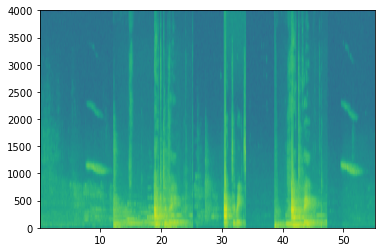

In [46]:
np.random.seed(8)
x, y = create_training_example(backgrounds[0], activates, negatives, Ty)

In [48]:
print(x.shape)
print(y.shape)

(101, 5511)
(1, 1375)


In [49]:
IPython.display.Audio("train.wav")

0
10
20
30
40
50
60
70
80
90


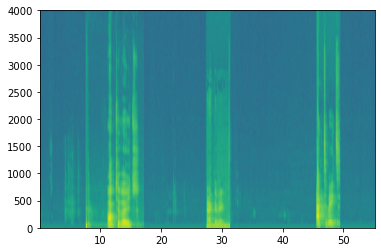

In [51]:
np.random.seed(4543)
nsamples = 100
X = []
Y = []
for i in range(0, nsamples):
    if i%10 == 0:
        print(i)
    x, y = create_training_example(backgrounds[i % 2], activates, negatives, Ty)
    X.append(x.swapaxes(0,1))   # converts shape from (n_freq, Tx)  --> (Tx, n_freq)
    Y.append(y.swapaxes(0,1))   # converts shape from (1, Ty)  --> (Ty, 1)
X = np.array(X)
Y = np.array(Y)

In [52]:
print(np.array(X.shape))
print(np.array(Y.shape))

[ 100 5511  101]
[ 100 1375    1]


In [53]:
os.makedirs('processed_data', exist_ok=True)

In [54]:
np.save('processed_data/train_X.npy', X)
np.save('processed_data/train_Y.npy', Y)

print("Saved X and Y to 'processed_data/' directory.")

Saved X and Y to 'processed_data/' directory.


### Development Set

* To test our model, we recorded a development set of 25 examples. 
* While our training data is synthesized, we want to create a development set using the same distribution as the real inputs. 
* Thus, we recorded 25 10-second audio clips of people saying "activate" and other random words, and labeled them by hand. 
* We should create the dev set to be as similar as possible to the test set distribution
    * This is why our **dev set uses real audio** rather than synthesized audio. 

In [55]:
# Load preprocessed dev set examples
X_dev = np.load("./XY_dev/X_dev.npy")
Y_dev = np.load("./XY_dev/Y_dev.npy")

In [59]:
print(X_dev.shape)
print(Y_dev.shape)

(25, 5511, 101)
(25, 1375, 1)
